# Key Points of DCGAN
- We prefer strided conv (for Discriminator) rather than     max pooling
- 1 to many mapping operation is performed in Transpose Convolution
  ie: []1x1 --> []3x3
  
- Medium Link: https://medium.com/activating-robotic-minds/up-sampling-with-transposed-convolution-9ae4f2df52d0

# 1. Data Collection- Paintings91

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# # unzip the dataa
# !unzip drive/My\ Drive/Paintings91

# 2. Dependencies

In [0]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import os
import math
import numpy as np
import pandas as pd
import time
from glob import glob
import datetime
import random
import sklearn as sk
from PIL import Image
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.activations import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import ResNet50

import matplotlib.pyplot as plt
%matplotlib inline

# 3. Data Pipeline

In [0]:
num_images = len(os.listdir('Paintings91/Images/'))

In [0]:
img = plt.imread('Paintings91/Images/ALBRECHT_DURER_12.jpg')

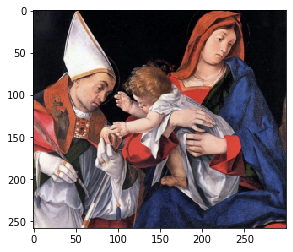

In [0]:
plt.imshow(img)

In [0]:
img.shape

(258, 300, 3)

### read the images

In [0]:
path = 'Paintings91/Images/'

In [0]:
x_train= np.empty((num_images, 256, 256, 3))

In [0]:
i = 0
for each in os.listdir(path):
  x_train[i]=image.img_to_array(image.load_img(path+each, target_size=(256, 256)))
  if i%500==0:
    print('{} images processed'.format(i))
  i+=1
  

0 images processed
500 images processed
1000 images processed
1500 images processed
2000 images processed
2500 images processed
3000 images processed
3500 images processed
4000 images processed


In [0]:
print(x_train.shape)

(4266, 256, 256, 3)


In [0]:
# normalize the images [-1, 1]
x_train = (x_train.astype(dtype=np.float16) - 127.0)/127.0

In [0]:
np.max(x_train)

1.008

# 4. Building Model

#### Model Parameters

In [0]:
NUM_EPOCHS = 50
BATCH_SIZE = 256
NO_OF_BATCHES = math.ceil(x_train.shape[0]/float(BATCH_SIZE))
HALF_BATCH_SIZE = int(BATCH_SIZE/2)

NOISE_DIM = 100

adam = Adam(lr=2e-4,beta_1=0.5)

#### Building Generator
- Output of the generator should be shape of image or x_train[0].shape

In [0]:
def create_generator():
  generator = Sequential()
  generator.add(Dense(4*4*128,input_shape=(NOISE_DIM,)))
  generator.add(Reshape((4,4,128)))
  generator.add(LeakyReLU(0.2))
  generator.add(BatchNormalization())


  # double the spatial size 8x8x64
  # upsampling with 2d transpose convolution
  generator.add(Conv2DTranspose(64, kernel_size=(5,5), strides=(2, 2), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(BatchNormalization())

  # repeat the above to move towards the desired shape now shape will be 16x16x64
  # upsampling with 2d transpose convolution
  generator.add(Conv2DTranspose(64, kernel_size=(5,5), strides=(2, 2), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(BatchNormalization())

  # repeat the above to move towards the desired shape now shape will be 32x32x64
  # upsampling with 2d transpose convolution
  generator.add(Conv2DTranspose(64, kernel_size=(5,5), strides=(2, 2), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(BatchNormalization())


  # repeat the above to move towards the desired shape now shape will be 64x64x64
  # upsampling with 2d transpose convolution
  generator.add(Conv2DTranspose(64, kernel_size=(5,5), strides=(2, 2), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(BatchNormalization())

  # repeat the above to move towards the desired shape now shape will be 128x128x64
  # upsampling with 2d transpose convolution
  generator.add(Conv2DTranspose(64, kernel_size=(5,5), strides=(2, 2), padding='same'))
  generator.add(LeakyReLU(0.2))
  generator.add(BatchNormalization())

  # repeat the above to move towards the desired shape now shape will be 256x256x3
  # upsampling with 2d transpose convolution
  generator.add(Conv2DTranspose(3, kernel_size=(5,5), strides=(2, 2), padding='same', activation='tanh'))
  
  generator.compile(optimizer=adam, loss='binary_crossentropy')
  
  
  return generator


In [0]:
generator = create_generator()

In [0]:
generator.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_35 (Dense)             (None, 2048)              206848    
_________________________________________________________________
reshape_23 (Reshape)         (None, 4, 4, 128)         0         
_________________________________________________________________
leaky_re_lu_113 (LeakyReLU)  (None, 4, 4, 128)         0         
_________________________________________________________________
batch_normalization_60 (Batc (None, 4, 4, 128)         512       
_________________________________________________________________
conv2d_transpose_60 (Conv2DT (None, 8, 8, 64)          204864    
_________________________________________________________________
leaky_re_lu_114 (LeakyReLU)  (None, 8, 8, 64)          0         
_________________________________________________________________
batch_normalization_61 (Batc (None, 8, 8, 64)        

### Build Discriminator

In [0]:
def create_dicriminator():
  
#   model = ResNet50(input_shape=(256, 256, 3), include_top=False, weights='imagenet', classes=2)
#   x = GlobalAveragePooling2D()(model.output)
#   x = Dense(units=64, activation='relu')(x)
#   x = Dense(units=16, activation='relu')(x)
#   x = Dense(units=8, activation='relu')(x)
#   output = Dense(units=2, activation='softmax')(x)
#   discriminator = Model(inputs=model.input, outputs=output)
  
#   discriminator.compile(optimizer=adam, loss='binary_crossentropy')



  discriminator = Sequential()
  discriminator.add(Conv2D(filters=64, kernel_size=(5,5), strides=(2, 2), input_shape=(256, 256, 3), activation=LeakyReLU(0.2),padding='same'))
  
  # new shape 128x128x64
  discriminator.add(Conv2D(filters=64, kernel_size=(5,5), strides=(2, 2), activation=LeakyReLU(0.2), padding='same'))
  
  # new shape 64x64x64
  discriminator.add(Conv2D(filters=64, kernel_size=(5,5), strides=(2, 2), activation=LeakyReLU(0.2), padding='same'))

  # new shape 32x32x64
  discriminator.add(Conv2D(filters=64, kernel_size=(5,5), strides=(2, 2), activation=LeakyReLU(0.2), padding='same'))

  # new shape 16x16x64
  discriminator.add(Conv2D(filters=64, kernel_size=(5,5), strides=(2, 2), activation=LeakyReLU(0.2), padding='same'))
  
  # new shape 8x8x64
  discriminator.add(Conv2D(filters=128, kernel_size=(5,5), strides=(2, 2), activation=LeakyReLU(0.2), padding='same'))
  
  
  # new shape 4x4x128
#   discriminator.add(Conv2D(filters=128, kernel_size=(5,5), strides=(2, 2), activation=LeakyReLU(0.2)))

  # flatten the output
  discriminator.add(Flatten())

  # output layer
  discriminator.add(Dense(units=1, activation='sigmoid'))
  
  # compile model
  discriminator.compile(optimizer=adam, loss='binary_crossentropy')
 
  
  return discriminator

In [0]:
discriminator =  create_dicriminator()

In [0]:
discriminator.summary()
generator.summary()

Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_63 (Conv2D)           (None, 128, 128, 64)      4864      
_________________________________________________________________
conv2d_64 (Conv2D)           (None, 64, 64, 64)        102464    
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 32, 32, 64)        102464    
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 16, 16, 64)        102464    
_________________________________________________________________
conv2d_67 (Conv2D)           (None, 8, 8, 64)          102464    
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 4, 4, 128)         204928    
_________________________________________________________________
flatten_5 (Flatten)          (None, 2048)            

#### Whoa the model has been created

# Model Training

In [0]:
!mkdir images
!mkdir models

mkdir: cannot create directory ‘images’: File exists
mkdir: cannot create directory ‘models’: File exists


In [0]:
discriminator.trainable = False
gan_input = Input(shape=(NOISE_DIM,))
generated_img = generator(gan_input)
gan_output = discriminator(generated_img)

#Functional API
model = Model(gan_input,gan_output)
model.compile(loss='binary_crossentropy',optimizer=adam)

def save_imgs(epoch,samples=12):
    noise = np.random.normal(0,1,size=(samples,NOISE_DIM))
    generated_imgs = generator.predict(noise)
    generated_imgs = generated_imgs.reshape(samples,256,256, 3)
    
    plt.figure(figsize=(12,12))
    for i in range(samples):
        plt.subplot(3,4,i+1)
        plt.imshow(generated_imgs[i],interpolation='nearest',cmap='gray')
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('images/gan_output_epoch_{0}.png'.format(epoch+1))
    plt.show()


In [0]:
NUM_EPOCHS = 200

Epoch 1 D loss: 5.485884 G loss: 19.109605
Epoch 2 D loss: 5.164955 G loss: 34.867408
Epoch 3 D loss: 4.399936 G loss: 31.169625
Epoch 4 D loss: 3.589632 G loss: 4.689844
Epoch 5 D loss: 3.049077 G loss: 1.130637
Epoch 6 D loss: 2.956044 G loss: 0.698742
Epoch 7 D loss: 2.910786 G loss: 0.614223
Epoch 8 D loss: 2.922320 G loss: 0.649501
Epoch 9 D loss: 2.929516 G loss: 0.858244
Epoch 10 D loss: 2.918973 G loss: 0.831581
Epoch 11 D loss: 2.903873 G loss: 0.753302
Epoch 12 D loss: 7.096906 G loss: 47.528851
Epoch 13 D loss: 7.017724 G loss: 53.543806
Epoch 14 D loss: 5.665907 G loss: 42.443759
Epoch 15 D loss: 3.718084 G loss: 5.394567
Epoch 16 D loss: 2.986856 G loss: 0.863389
Epoch 17 D loss: 2.910769 G loss: 0.726814
Epoch 18 D loss: 2.903936 G loss: 0.900849
Epoch 19 D loss: 4.941774 G loss: 26.929038


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 20 D loss: 6.001742 G loss: 37.931538


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


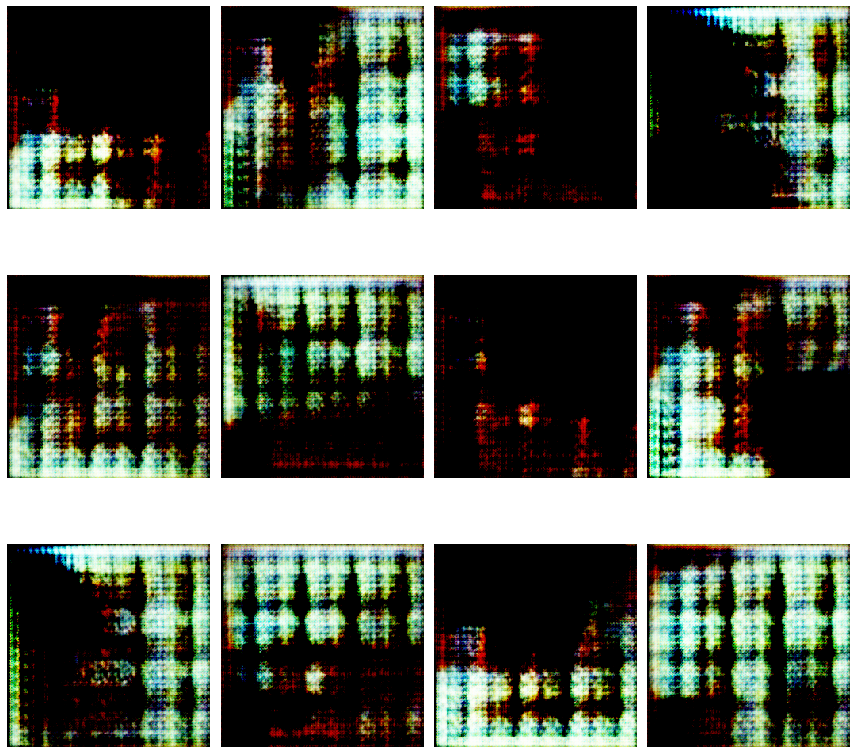

Epoch 21 D loss: 4.994247 G loss: 30.239244
Epoch 22 D loss: 3.744871 G loss: 3.242038
Epoch 23 D loss: 3.215412 G loss: 2.818102
Epoch 24 D loss: 3.086092 G loss: 2.551171
Epoch 25 D loss: 3.164970 G loss: 5.064022
Epoch 26 D loss: 3.153986 G loss: 3.777659
Epoch 27 D loss: 6.879614 G loss: 64.077321
Epoch 28 D loss: 5.686777 G loss: 55.608917
Epoch 29 D loss: 5.061953 G loss: 37.082037
Epoch 30 D loss: 3.086081 G loss: 2.625054
Epoch 31 D loss: 2.994838 G loss: 2.513847
Epoch 32 D loss: 2.991737 G loss: 3.265330
Epoch 33 D loss: 3.098162 G loss: 4.270577
Epoch 34 D loss: 7.000966 G loss: 52.929392
Epoch 35 D loss: 3.584515 G loss: 3.744204
Epoch 36 D loss: 3.181674 G loss: 2.407052
Epoch 37 D loss: 3.048302 G loss: 2.522633
Epoch 38 D loss: 6.756145 G loss: 24.313435
Epoch 39 D loss: 4.704024 G loss: 75.165071


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 40 D loss: 4.953890 G loss: 40.012218


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


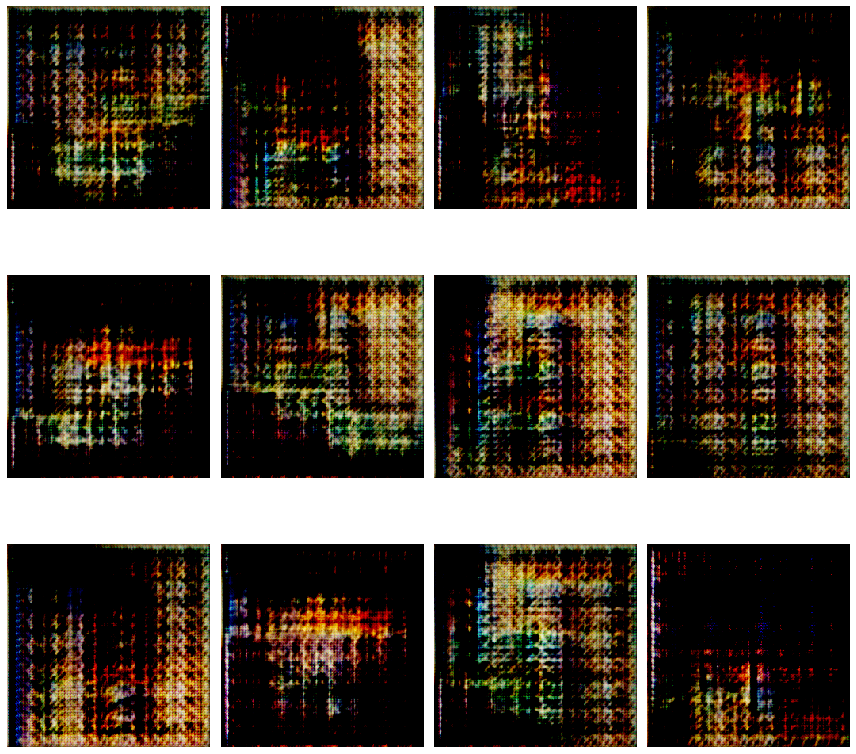

Epoch 41 D loss: 3.071822 G loss: 1.178683
Epoch 42 D loss: 2.901607 G loss: 0.505746
Epoch 43 D loss: 2.874706 G loss: 0.483608
Epoch 44 D loss: 2.877871 G loss: 0.651100
Epoch 45 D loss: 2.940888 G loss: 1.912213
Epoch 46 D loss: 5.963930 G loss: 70.269986
Epoch 47 D loss: 5.480363 G loss: 62.432859
Epoch 48 D loss: 4.557955 G loss: 15.871529
Epoch 49 D loss: 3.602863 G loss: 7.305664
Epoch 50 D loss: 3.250735 G loss: 5.106312
Epoch 51 D loss: 5.377196 G loss: 16.448331
Epoch 52 D loss: 3.503509 G loss: 5.064478
Epoch 53 D loss: 2.930273 G loss: 1.216263
Epoch 54 D loss: 2.869148 G loss: 1.067591
Epoch 55 D loss: 2.853251 G loss: 1.126253
Epoch 56 D loss: 2.893782 G loss: 1.450088
Epoch 57 D loss: 6.820248 G loss: 9.246609
Epoch 58 D loss: 3.388959 G loss: 3.164293
Epoch 59 D loss: 3.301486 G loss: 8.495512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 60 D loss: 3.426852 G loss: 8.163733


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


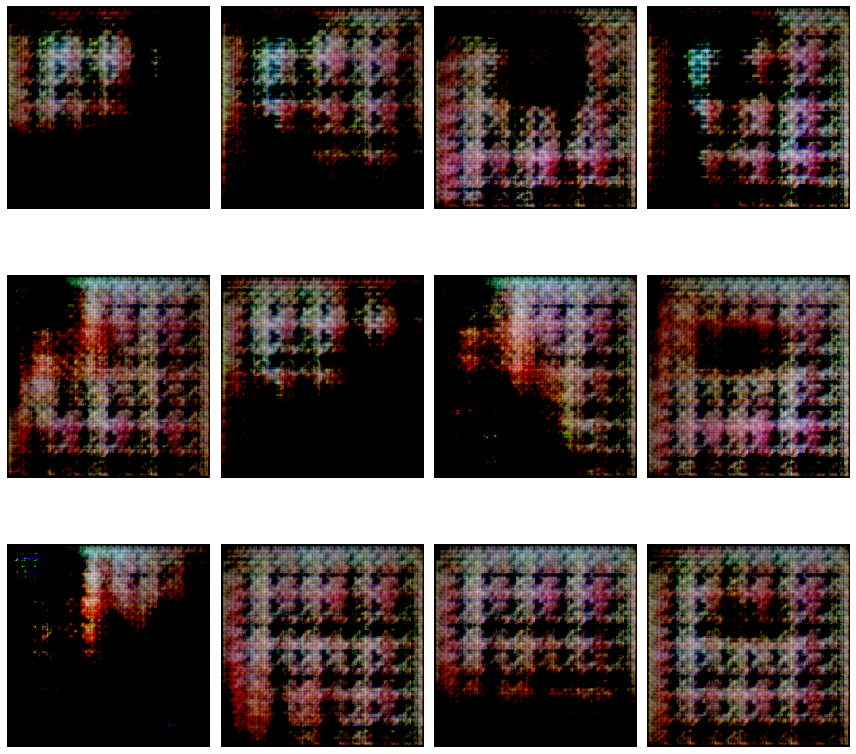

Epoch 61 D loss: 3.407911 G loss: 9.510846
Epoch 62 D loss: 2.959502 G loss: 3.686686
Epoch 63 D loss: 2.924668 G loss: 1.820875
Epoch 64 D loss: 2.892308 G loss: 1.186143
Epoch 65 D loss: 7.506417 G loss: 25.526497
Epoch 66 D loss: 6.413717 G loss: 64.421660
Epoch 67 D loss: 6.635068 G loss: 41.972091
Epoch 68 D loss: 4.633563 G loss: 17.159943
Epoch 69 D loss: 3.551988 G loss: 4.141213
Epoch 70 D loss: 3.230838 G loss: 2.837296
Epoch 71 D loss: 3.204528 G loss: 2.021322
Epoch 72 D loss: 3.244490 G loss: 3.269841
Epoch 73 D loss: 3.433888 G loss: 6.738682
Epoch 74 D loss: 4.231857 G loss: 43.618048
Epoch 75 D loss: 3.049748 G loss: 3.137275
Epoch 76 D loss: 2.893359 G loss: 1.455402
Epoch 77 D loss: 2.861193 G loss: 1.007188
Epoch 78 D loss: 2.846371 G loss: 0.831824
Epoch 79 D loss: 2.858238 G loss: 0.837498


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 80 D loss: 8.250679 G loss: 37.174094


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


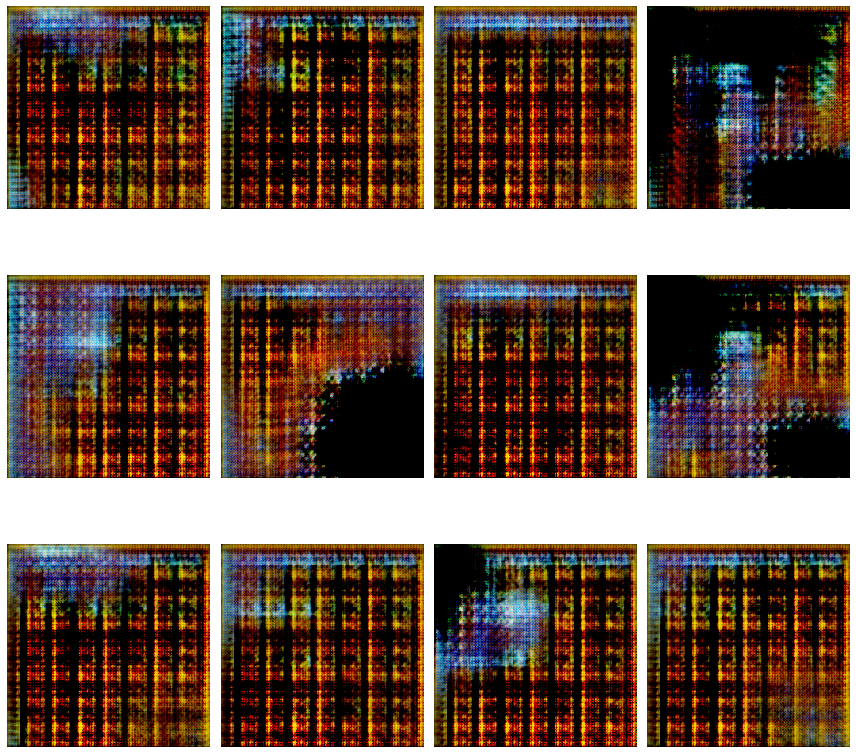

Epoch 81 D loss: 3.472448 G loss: 4.880639
Epoch 82 D loss: 5.717742 G loss: 31.981946
Epoch 83 D loss: 3.247672 G loss: 3.010457
Epoch 84 D loss: 3.018013 G loss: 2.148017
Epoch 85 D loss: 3.019091 G loss: 2.019664
Epoch 86 D loss: 3.069289 G loss: 2.994536
Epoch 87 D loss: 5.731504 G loss: 25.303535
Epoch 88 D loss: 3.015499 G loss: 0.940230
Epoch 89 D loss: 2.914756 G loss: 0.678406
Epoch 90 D loss: 2.884868 G loss: 0.814490
Epoch 91 D loss: 2.888694 G loss: 0.897766
Epoch 92 D loss: 2.910819 G loss: 1.443872
Epoch 93 D loss: 4.700974 G loss: 59.989550
Epoch 94 D loss: 4.744099 G loss: 26.259723
Epoch 95 D loss: 3.461102 G loss: 9.854845
Epoch 96 D loss: 5.752274 G loss: 16.160853
Epoch 97 D loss: 3.551111 G loss: 5.303260
Epoch 98 D loss: 3.239052 G loss: 3.759153
Epoch 99 D loss: 4.106814 G loss: 12.083566


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 100 D loss: 8.168303 G loss: 75.514487


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


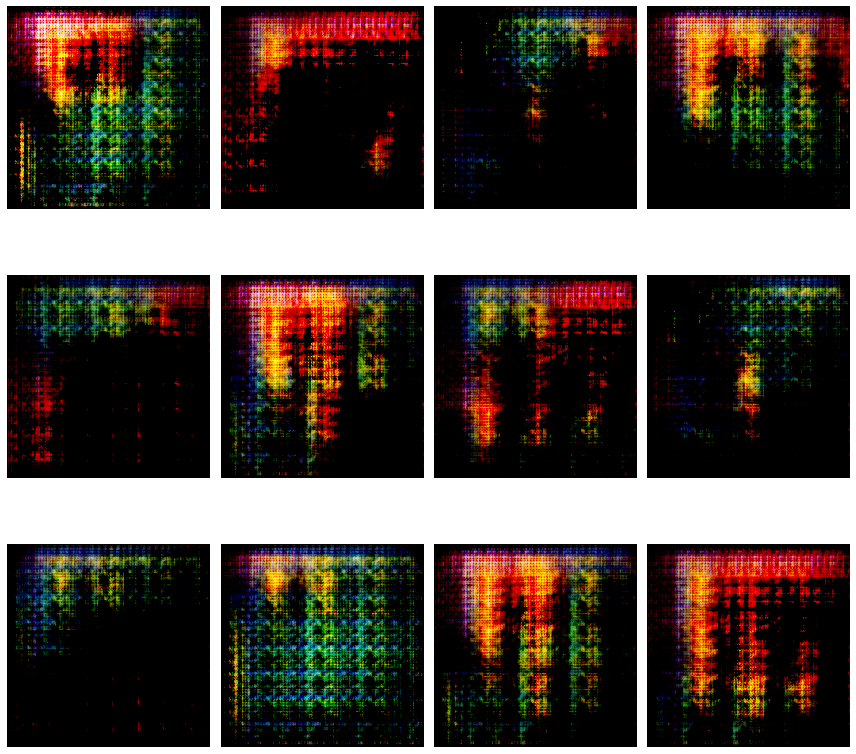

Epoch 101 D loss: 5.349236 G loss: 49.463518
Epoch 102 D loss: 3.688481 G loss: 13.216404
Epoch 103 D loss: 3.074158 G loss: 2.268850
Epoch 104 D loss: 3.004427 G loss: 3.590423
Epoch 105 D loss: 4.736584 G loss: 55.087125
Epoch 106 D loss: 4.832434 G loss: 56.324449
Epoch 107 D loss: 3.211500 G loss: 5.385343
Epoch 108 D loss: 2.982674 G loss: 2.000048
Epoch 109 D loss: 2.917750 G loss: 1.302932
Epoch 110 D loss: 2.943372 G loss: 1.872128
Epoch 111 D loss: 2.981922 G loss: 2.097476
Epoch 112 D loss: 4.982064 G loss: 19.090641
Epoch 113 D loss: 3.623589 G loss: 11.294059
Epoch 114 D loss: 3.267144 G loss: 5.119859
Epoch 115 D loss: 3.073743 G loss: 2.269636
Epoch 116 D loss: 3.051076 G loss: 5.794849
Epoch 117 D loss: 7.673534 G loss: 55.368104
Epoch 118 D loss: 5.435588 G loss: 42.947639
Epoch 119 D loss: 4.834832 G loss: 20.976304


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 120 D loss: 3.599962 G loss: 7.666177


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


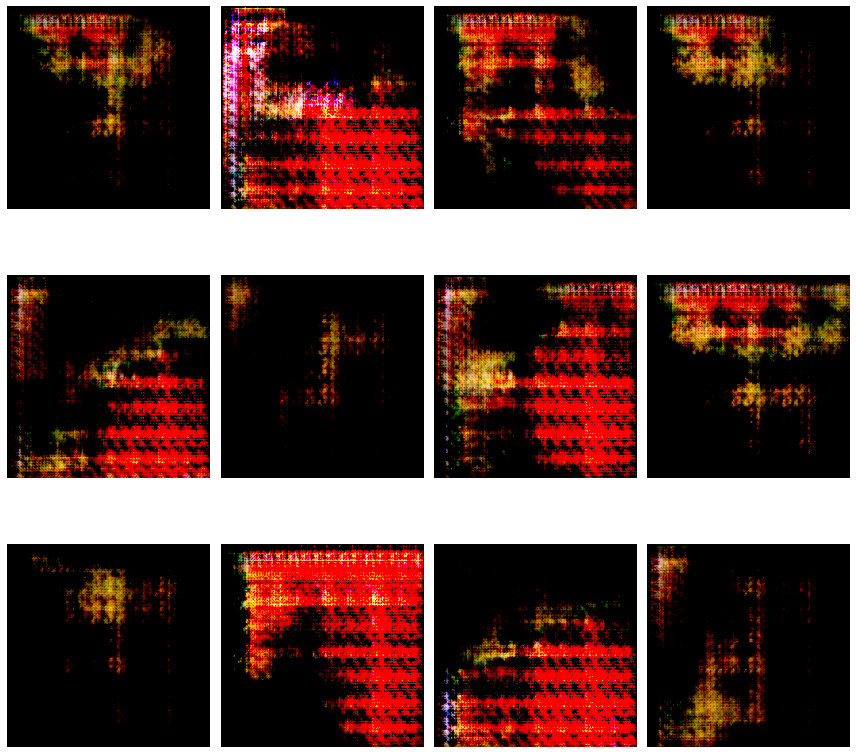

Epoch 121 D loss: 3.066327 G loss: 2.199289
Epoch 122 D loss: 2.947460 G loss: 1.419173
Epoch 123 D loss: 2.899646 G loss: 0.997703
Epoch 124 D loss: 2.862792 G loss: 0.782746
Epoch 125 D loss: 2.871394 G loss: 0.798319
Epoch 126 D loss: 2.872505 G loss: 1.012534
Epoch 127 D loss: 8.262834 G loss: 59.704288
Epoch 128 D loss: 4.921130 G loss: 30.809020
Epoch 129 D loss: 3.330790 G loss: 3.417358
Epoch 130 D loss: 4.813629 G loss: 17.397514
Epoch 131 D loss: 3.918768 G loss: 20.008805
Epoch 132 D loss: 3.534888 G loss: 25.342800
Epoch 133 D loss: 5.005438 G loss: 24.750620
Epoch 134 D loss: 2.991987 G loss: 2.322941
Epoch 135 D loss: 2.851823 G loss: 0.885541
Epoch 136 D loss: 2.845504 G loss: 0.778033
Epoch 137 D loss: 2.829602 G loss: 0.677536
Epoch 138 D loss: 2.820556 G loss: 0.624821
Epoch 139 D loss: 2.820198 G loss: 0.710242


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 140 D loss: 2.829903 G loss: 0.793890


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


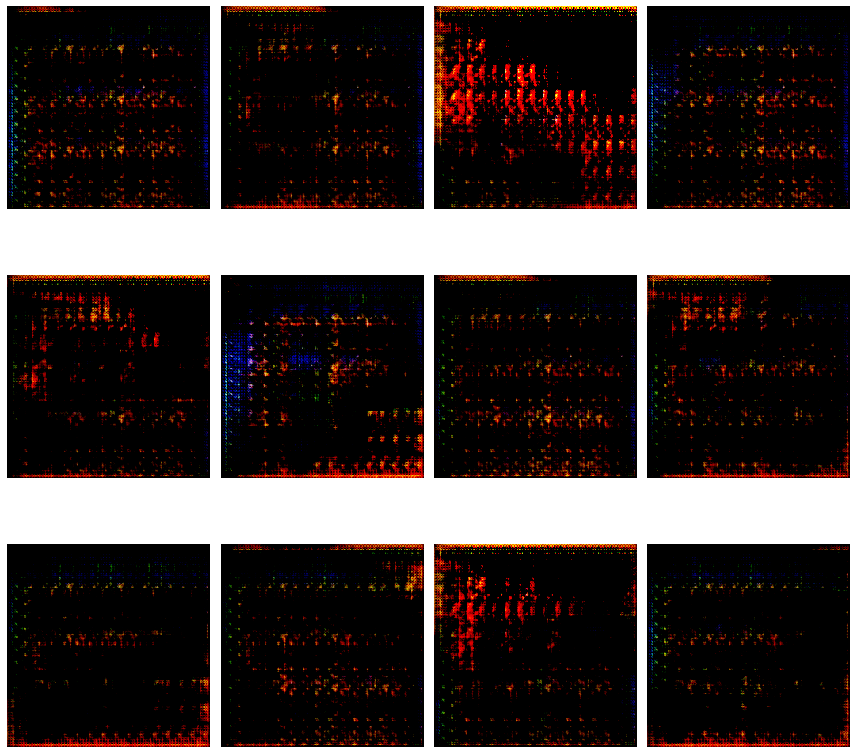

Epoch 141 D loss: 2.836620 G loss: 0.956046
Epoch 142 D loss: 2.810981 G loss: 0.681817
Epoch 143 D loss: 9.576135 G loss: 43.517145
Epoch 144 D loss: 5.793487 G loss: 68.124738
Epoch 145 D loss: 4.506985 G loss: 32.514944
Epoch 146 D loss: 3.977795 G loss: 7.028554
Epoch 147 D loss: 2.960873 G loss: 1.080614
Epoch 148 D loss: 2.895895 G loss: 0.791639
Epoch 149 D loss: 2.866999 G loss: 0.717015
Epoch 150 D loss: 2.848792 G loss: 0.654193
Epoch 151 D loss: 2.869342 G loss: 0.860919
Epoch 152 D loss: 4.685601 G loss: 40.936750
Epoch 153 D loss: 3.412690 G loss: 17.387433
Epoch 154 D loss: 3.020422 G loss: 5.045452
Epoch 155 D loss: 5.724754 G loss: 50.677452
Epoch 156 D loss: 5.165857 G loss: 32.319742
Epoch 157 D loss: 3.865062 G loss: 11.822968
Epoch 158 D loss: 4.837489 G loss: 36.008955
Epoch 159 D loss: 3.235866 G loss: 16.905312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 160 D loss: 3.326921 G loss: 11.474847


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


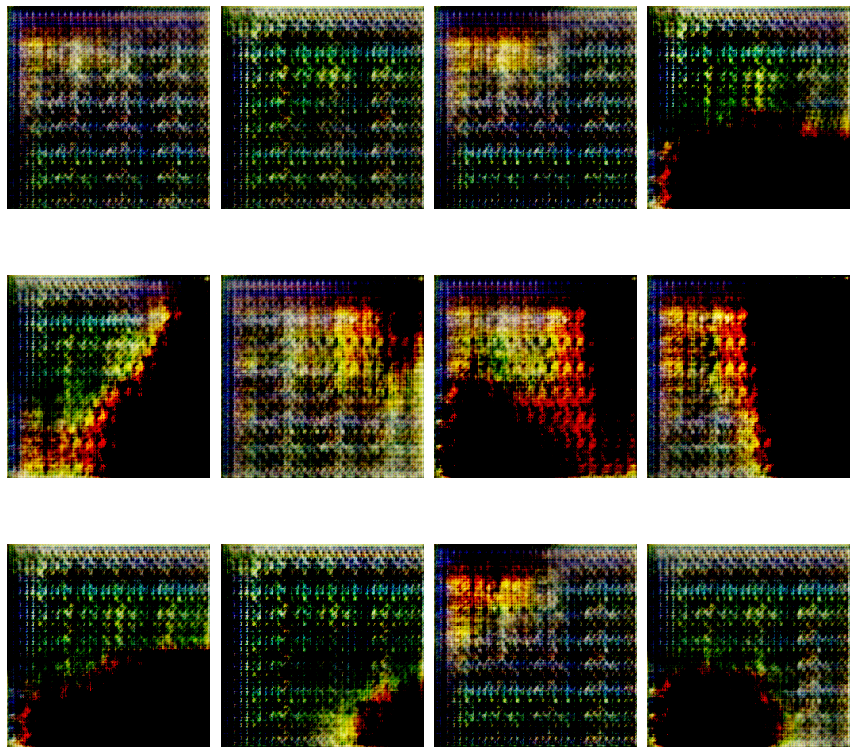

Epoch 161 D loss: 2.992543 G loss: 2.164656
Epoch 162 D loss: 2.977906 G loss: 1.363075
Epoch 163 D loss: 2.875121 G loss: 1.128300
Epoch 164 D loss: 2.847912 G loss: 0.959751
Epoch 165 D loss: 2.869369 G loss: 0.963558
Epoch 166 D loss: 5.499053 G loss: 30.477252
Epoch 167 D loss: 7.162358 G loss: 55.629415
Epoch 168 D loss: 4.113111 G loss: 27.361302
Epoch 169 D loss: 3.673139 G loss: 7.758674
Epoch 170 D loss: 2.917068 G loss: 1.205432
Epoch 171 D loss: 2.928238 G loss: 1.785243
Epoch 172 D loss: 2.940205 G loss: 2.474361
Epoch 173 D loss: 2.901980 G loss: 2.355117
Epoch 174 D loss: 2.966964 G loss: 6.498303
Epoch 175 D loss: 3.105164 G loss: 4.970840
Epoch 176 D loss: 2.859607 G loss: 0.818100
Epoch 177 D loss: 2.856289 G loss: 1.238356
Epoch 178 D loss: 4.943772 G loss: 70.864266
Epoch 179 D loss: 3.265304 G loss: 13.086870


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 180 D loss: 2.925727 G loss: 2.350589


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


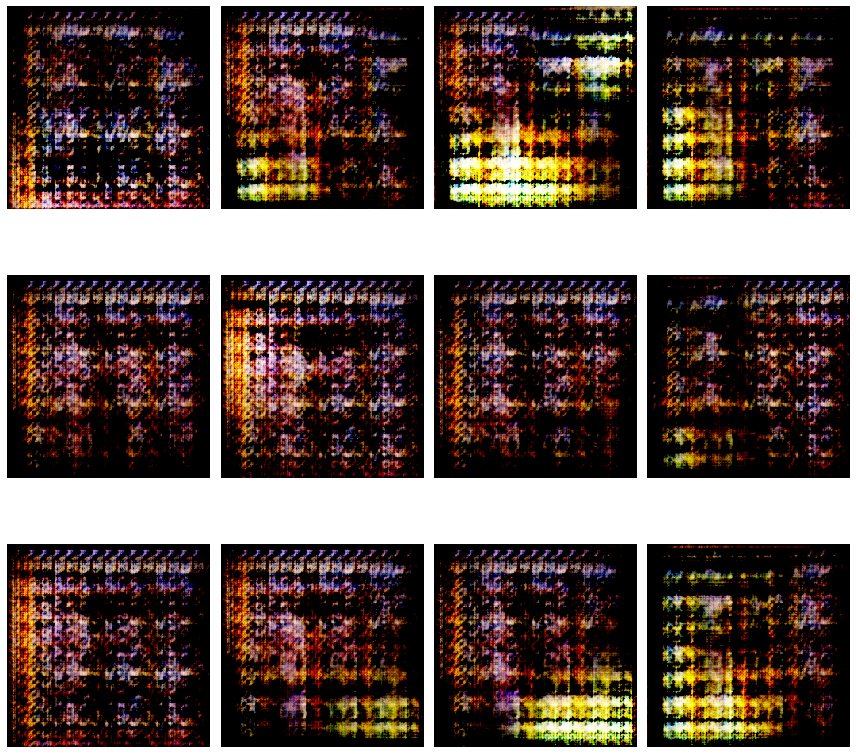

Epoch 181 D loss: 2.869652 G loss: 1.396684
Epoch 182 D loss: 2.850942 G loss: 1.229910
Epoch 183 D loss: 2.857577 G loss: 1.819673
Epoch 184 D loss: 4.770310 G loss: 50.993621
Epoch 185 D loss: 3.079490 G loss: 5.714564
Epoch 186 D loss: 2.940459 G loss: 3.996950
Epoch 187 D loss: 2.931354 G loss: 5.170056
Epoch 188 D loss: 2.970195 G loss: 8.729129
Epoch 189 D loss: 3.194604 G loss: 15.044679
Epoch 190 D loss: 2.936755 G loss: 3.603181
Epoch 191 D loss: 3.086192 G loss: 5.055395
Epoch 192 D loss: 3.037239 G loss: 2.872207
Epoch 193 D loss: 2.834915 G loss: 1.064221
Epoch 194 D loss: 2.832303 G loss: 0.955399
Epoch 195 D loss: 2.830973 G loss: 1.063945
Epoch 196 D loss: 2.876141 G loss: 1.972711
Epoch 197 D loss: 3.267301 G loss: 9.588576
Epoch 198 D loss: 2.874589 G loss: 1.843639
Epoch 199 D loss: 2.826031 G loss: 1.099827


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch 200 D loss: 5.586863 G loss: 35.440786


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


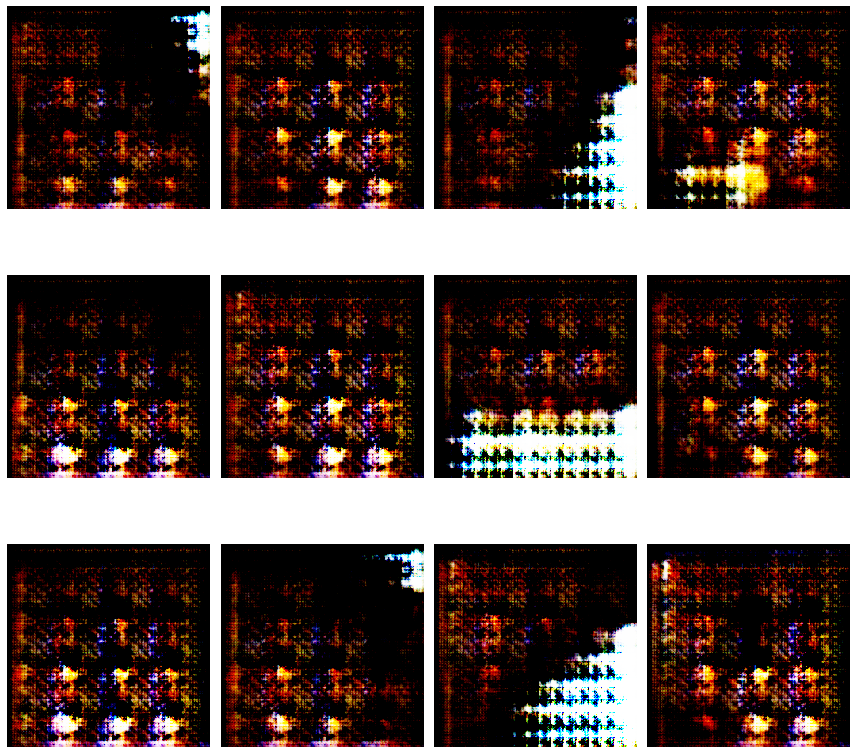

In [0]:
for epoch in range(NUM_EPOCHS):
    epoch_d_loss = 0.
    epoch_g_loss = 0.
    
    for step in range(NO_OF_BATCHES):
        #randomly select 50% real images
        idx = np.random.randint(0,x_train.shape[0],HALF_BATCH_SIZE)
        real_imgs = x_train[idx]
        
        # generate 50% random images
        noise = np.random.normal(0,1,size=(HALF_BATCH_SIZE,NOISE_DIM))
        fake_imgs = generator.predict(noise)
        
        
        # one sided label smoothing
        real_y = np.ones((HALF_BATCH_SIZE,1))*0.9 #Label Smoothing, Works well in practice
        fake_y = np.zeros((HALF_BATCH_SIZE,1))
        
        # train on real and fake images
        d_loss_real = discriminator.train_on_batch(real_imgs,real_y) #updates the weights of discriminator
        d_loss_fake = discriminator.train_on_batch(fake_imgs,fake_y) 
        d_loss = 0.5*d_loss_real + 0.5*d_loss_fake
        
        epoch_d_loss += d_loss
        
        
        #Train Generator (Complete Model Generator + Frozen Discriminator)
        
        noise = np.random.normal(0,1,size=(BATCH_SIZE,NOISE_DIM))
        real_y = np.ones((BATCH_SIZE,1))
        g_loss = model.train_on_batch(noise,real_y)
        epoch_g_loss += g_loss
        
    print("Epoch %d D loss: %f G loss: %f" % ((epoch + 1), epoch_d_loss, epoch_g_loss))

    if (epoch+1)%20==0:
        generator.save('models/gan_generator_{0}.h5'.format(epoch+1))
        save_imgs(epoch)

##### After training for multiple epochs we can see that the results are not promising, hence we are going to get a new architecture

# **Tensorflow Implementation of DCGAN**
##### Source: https://github.com/gsurma/image_generator/blob/master/ImageGeneratorDCGAN.ipynb

In [0]:
# # generator function

# def generator(z, output_channel_dim, training):
  
#   with tf.variable_scope('generator', reuse= not training):
    
#     # 8x8x2048
#     fully_connected = tf.layers.dense(z, 8*8*2048)
#     fully_connected = tf.reshape(fully_connected, (-1, 8, 8, 2048))
#     fully_connected = tf.nn.leaky_relu(fully_connected)

    
#     # 8x8x2048 -> 16x16x1024
#     trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected, filters=1024, kernel_size=[5,5], strides=[2,2], padding="SAME",
#                   kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name="trans_conv1")
#     batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1, training=training, epsilon=EPSILON, name="batch_trans_conv1")
#     trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1, name="trans_conv1_out")
    

#     # 16x16x1024 -> 32x32x512
#     trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out, filters=512, kernel_size=[5,5], strides=[2,2], padding="SAME",
#                   kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name="trans_conv2")
#     batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2, training=training, epsilon=EPSILON, name="batch_trans_conv2")
#     trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2, name="trans_conv2_out")

    
#     # 32x32x512 -> 64x64x256
#     trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out, filters=256, kernel_size=[5,5], strides=[2,2], padding="SAME",
#                   kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name="trans_conv3")
#     batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3, training=training, epsilon=EPSILON, name="batch_trans_conv3")
#     trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3, name="trans_conv3_out")

#     # 64x64x256 -> 128x128x128
#     trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out, filters=128, kernel_size=[5,5], strides=[2,2], padding="SAME",
#                   kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name="trans_conv4")
#     batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4, training=training, epsilon=EPSILON,name="batch_trans_conv4")
#     trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4, name="trans_conv4_out")
    
#     # 128x128x128 -> 256x256x64
#     trans_conv5 = tf.layers.conv2d_transpose(inputs=trans_conv4_out, filters=64, kernel_size=[5,5], strides=[2,2], padding="SAME",
#                   kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name="trans_conv5")
#     batch_trans_conv5 = tf.layers.batch_normalization(inputs = trans_conv5, training=training, epsilon=EPSILON,name="batch_trans_conv5")
#     trans_conv5_out = tf.nn.leaky_relu(batch_trans_conv5, name="trans_conv5_out")

#     # 256x256x64 -> 256x256x3
#     logits = tf.layers.conv2d_transpose(inputs=trans_conv5_out, filters=3, kernel_size=[5,5], strides=[1,1], padding="SAME",
#              kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name="logits")
#     out = tf.tanh(logits, name="out")
    
#     return out


def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        # 8x8x1024
        fully_connected = tf.layers.dense(z, 8*8*1024)
        fully_connected = tf.reshape(fully_connected, (-1, 8, 8, 1024))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 8x8x1024 -> 16x16x512
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=512,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 16x16x512 -> 32x32x256
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
        # 32x32x256 -> 64x64x128
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        
        # 64x64x128 -> 128x128x64
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 128x128x64 -> 128x128x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out
    

In [0]:
# def discriminator(x, reuse):
  
#   with  tf.variable_scope("discriminator", reuse=reuse):
    
#     #256x256x3 -> 256x256x64
#     conv1 = tf.layers.conv2d(inputs=x, filters=64, kernel_size=[1, 1], strides=[1, 1], padding='same',
#             kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name='conv1')
#     batch_norm1 = tf.layers.batch_normalization(conv1, training=True, epsilon=EPSILON, name='batch_norm1')
#     conv1_out = tf.nn.leaky_relu(batch_norm1, name="conv1_out")
    
#     #256x256x64 -> 128x128x128
#     conv2 = tf.layers.conv2d(inputs=conv1_out, filters=128, kernel_size=[5, 5], strides=[2, 2], padding='same',
#             kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name='conv2')
#     batch_norm2 = tf.layers.batch_normalization(conv2,training=True, epsilon=EPSILON, name='batch_norm2')
#     conv2_out = tf.nn.leaky_relu(batch_norm2, name='conv2_out')
    
    
#     #128x128x128 -> 64x64x256
#     conv3 = tf.layers.conv2d(inputs=conv2_out, filters=256, kernel_size=[5, 5], strides=[2, 2], padding='same',
#             kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name='conv3')
#     batch_norm3 = tf.layers.batch_normalization(conv3,training=True, epsilon=EPSILON, name='batch_norm3')
#     conv3_out = tf.nn.leaky_relu(batch_norm3, name='conv3_out')
    
#     # 64x64x256 -> 32x32x512
#     conv4 = tf.layers.conv2d(inputs=conv3_out, filters=512, kernel_size=[5, 5], strides=[2, 2], padding='same',
#             kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name='conv4')
#     batch_norm4 = tf.layers.batch_normalization(conv4,training=True, epsilon=EPSILON, name='batch_norm4')
#     conv4_out = tf.nn.leaky_relu(batch_norm4, name='conv4_out')
    
#     # 32x32x512 -> 16x16x1024
#     conv5 = tf.layers.conv2d(inputs=conv4_out, filters=1024, kernel_size=[5, 5], strides=[2, 2], padding='same',
#             kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name='conv5')
#     batch_norm5 = tf.layers.batch_normalization(conv5,training=True, epsilon=EPSILON, name='batch_norm5')
#     conv5_out = tf.nn.leaky_relu(batch_norm5, name='conv5_out')
    
#     # 16x16x1024 -> 8x8x2048
#     conv6 = tf.layers.conv2d(inputs=conv5_out, filters=2048, kernel_size=[5, 5], strides=[2, 2], padding='same',
#             kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), name='conv6')
#     batch_norm6 = tf.layers.batch_normalization(conv6,training=True, epsilon=EPSILON, name='batch_norm6')
#     conv6_out = tf.nn.leaky_relu(batch_norm6, name='conv6_out')
    
    
#     # flatten layer
#     flatten = tf.reshape(-1, 8*8*2048)
    
#     logits = tf.layers.dense(inputs=flatten, units=1, activation=None)
    
#     out = tf.sigmoid(logits)
    
#     return out

def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 128*128*3 -> 64x64x64 
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=64,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 64x64x64-> 32x32x128 
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 32x32x128 -> 16x16x256  
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
        # 16x16x256 -> 16x16x512
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=512,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 16x16x512 -> 8x8x1024
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=1024,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 8*8*1024))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits


In [0]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real), mean=0.0, stddev=random.uniform(0.0, 0.1), dtype=tf.float32)
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    return d_loss, g_loss

In [0]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1).minimize(g_loss, var_list=g_vars) 
        
    return d_train_opt, g_train_opt

In [0]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

In [0]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (12, 12))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index]
        axis.imshow(image_array)
        image = Image.fromarray(image_array)
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 
    plt.savefig(name+"_"+str(epoch)+".png", bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()

In [0]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, OUTPUT_DIR + "samples", epoch)

In [0]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [0]:
def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img)
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches


In [0]:
def train(get_batches, data_shape, checkpoint_to_load=None):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in range(EPOCHS):        
            epoch += 1
            start_time = time.time()

            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)



#### Training

In [0]:
# Paths
INPUT_DATA_DIR = "/content/Paintings91/Images/" # Path to the folder with input images. For more info check simspons_dataset.txt
OUTPUT_DIR = './{date:%Y-%m-%d_%H:%M:%S}/'.format(date=datetime.datetime.now())
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

In [0]:
# Hyperparameters
IMAGE_SIZE = 128
NOISE_SIZE = 100
LR_D = 0.00004
LR_G = 0.0004
BATCH_SIZE = 64
EPOCHS = 300
BETA1 = 0.5
WEIGHT_INIT_STDDEV = 0.02
EPSILON = 0.00005
SAMPLES_TO_SHOW = 5

In [0]:
input_images = np.asarray([np.asarray(Image.open(file).resize((IMAGE_SIZE, IMAGE_SIZE))) for file in glob(INPUT_DATA_DIR + '*') if file.endswith('.jpg')])


In [114]:
print ("Input: " + str(input_images.shape))

Input: (4256, 128, 128, 3)


In [0]:
np.random.shuffle(input_images)

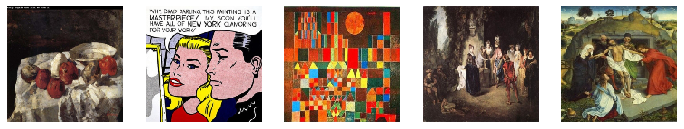

In [116]:
sample_images = random.sample(list(input_images), SAMPLES_TO_SHOW)
show_samples(sample_images, OUTPUT_DIR + "inputs", 0)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Epoch 1/300 
Duration: 61.23345 
D Loss: 6.16636 
G Loss: 0.03059


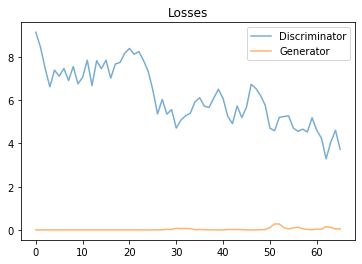

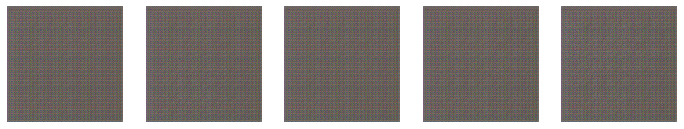

Epoch 2/300 
Duration: 56.28952 
D Loss: 2.26407 
G Loss: 0.27736


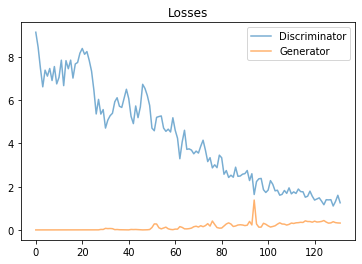

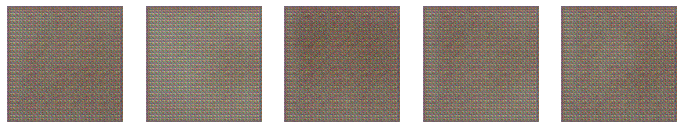

Epoch 3/300 
Duration: 56.55230 
D Loss: 1.21651 
G Loss: 0.44250


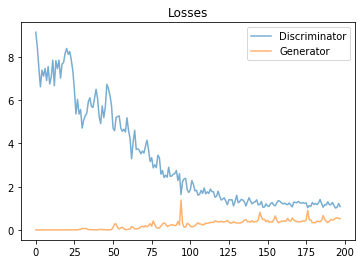

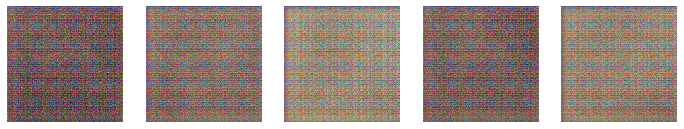

Epoch 4/300 
Duration: 56.54874 
D Loss: 0.97871 
G Loss: 0.61557


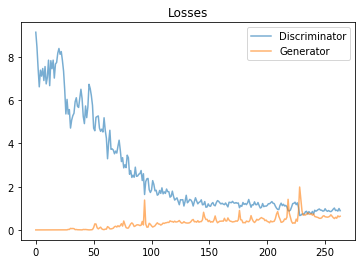

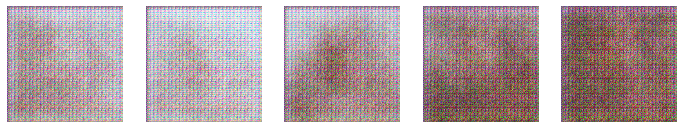

Epoch 5/300 
Duration: 56.51934 
D Loss: 0.92580 
G Loss: 0.59002


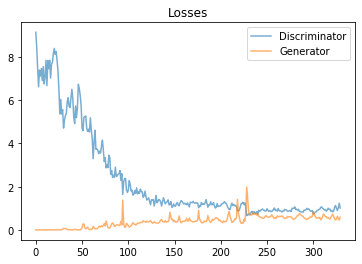

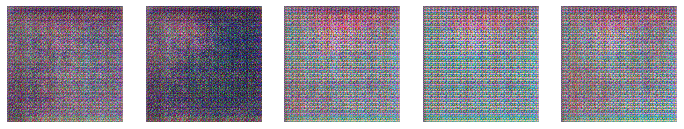

Epoch 6/300 
Duration: 56.40674 
D Loss: 0.85911 
G Loss: 0.70292


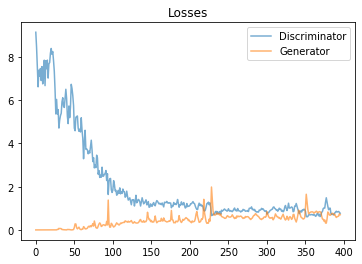

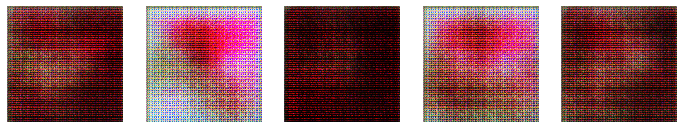

Epoch 7/300 
Duration: 56.48722 
D Loss: 0.84851 
G Loss: 0.66954


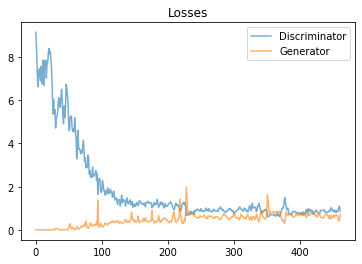

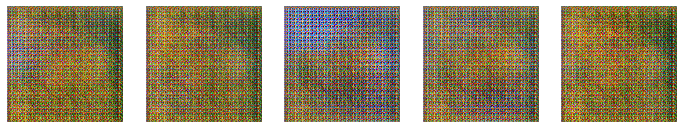

Epoch 8/300 
Duration: 56.50763 
D Loss: 0.77317 
G Loss: 0.73888


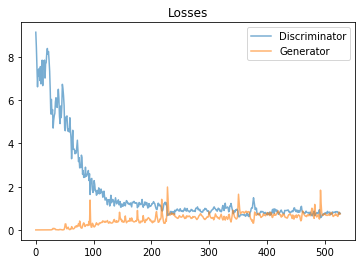

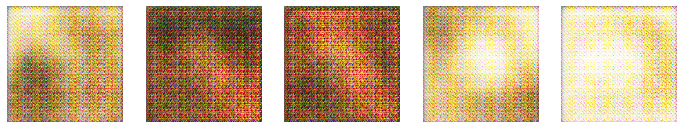

Epoch 9/300 
Duration: 56.46692 
D Loss: 0.80384 
G Loss: 0.67466


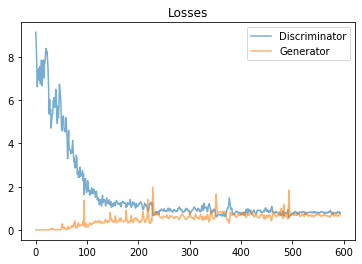

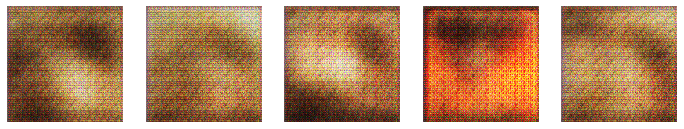

Epoch 10/300 
Duration: 56.45822 
D Loss: 0.77574 
G Loss: 0.69424


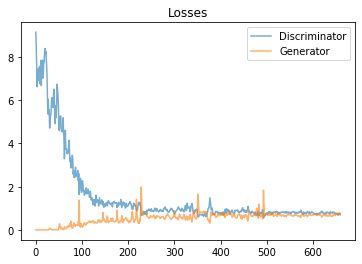

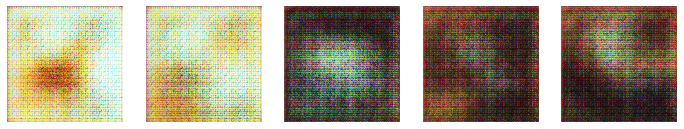

Epoch 11/300 
Duration: 56.45894 
D Loss: 0.76885 
G Loss: 0.70556


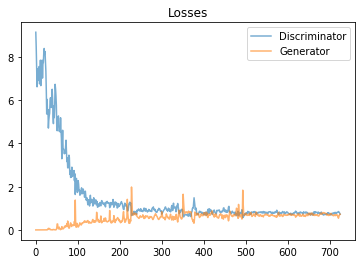

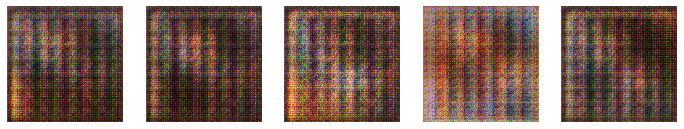

Epoch 12/300 
Duration: 56.51024 
D Loss: 0.78523 
G Loss: 0.68602


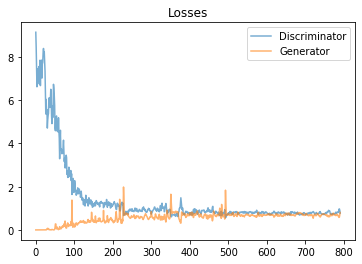

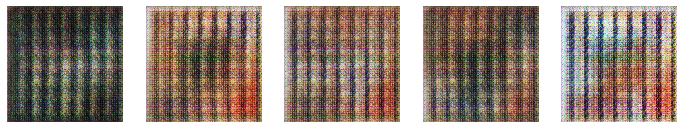

Epoch 13/300 
Duration: 56.40641 
D Loss: 0.76033 
G Loss: 0.73967


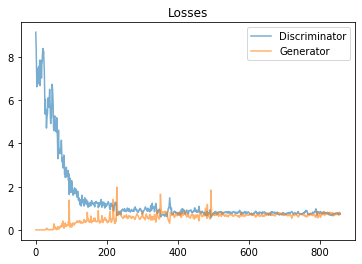

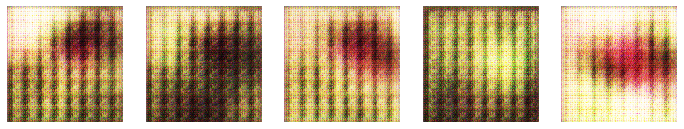

Epoch 14/300 
Duration: 56.46579 
D Loss: 0.74422 
G Loss: 0.72973


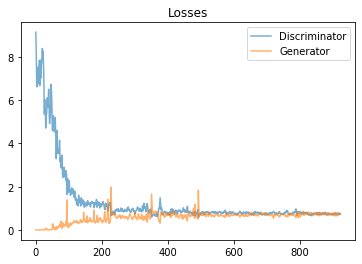

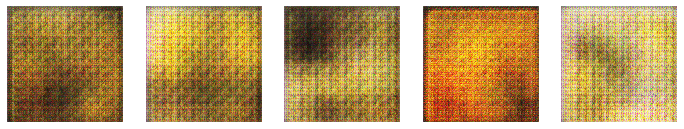

Epoch 15/300 
Duration: 56.33991 
D Loss: 0.73724 
G Loss: 0.72009


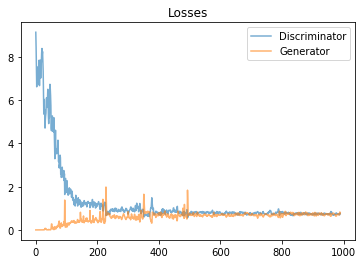

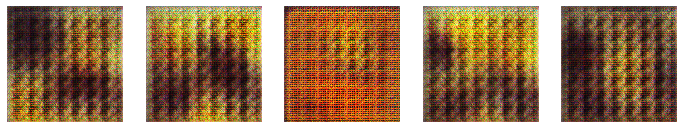

Epoch 16/300 
Duration: 56.30478 
D Loss: 0.75237 
G Loss: 0.72808


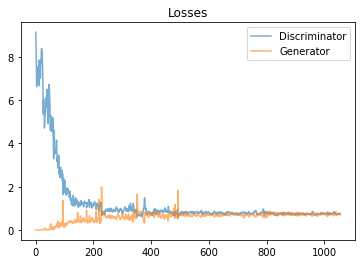

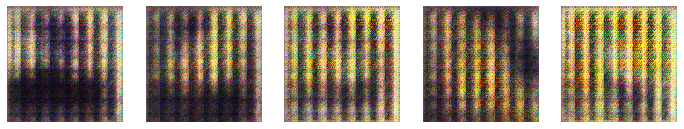

Epoch 17/300 
Duration: 56.30134 
D Loss: 0.72872 
G Loss: 0.74029


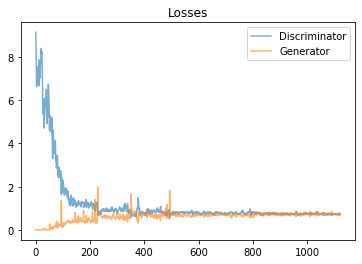

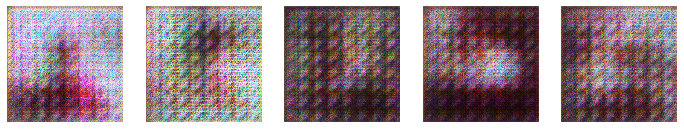

Epoch 18/300 
Duration: 56.41236 
D Loss: 0.74210 
G Loss: 0.70637


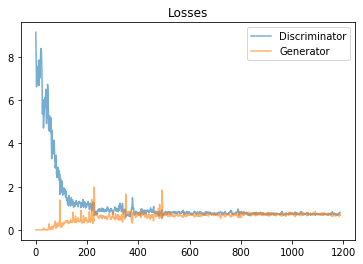

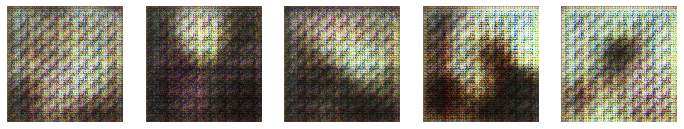

Epoch 19/300 
Duration: 56.38061 
D Loss: 0.74690 
G Loss: 0.74043


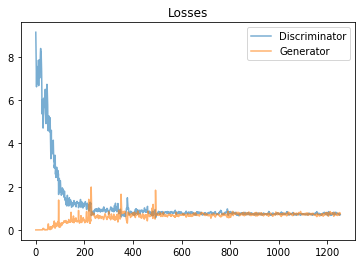

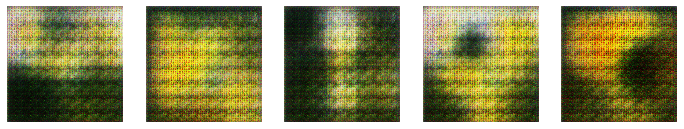

Epoch 20/300 
Duration: 56.34092 
D Loss: 0.72377 
G Loss: 0.75833


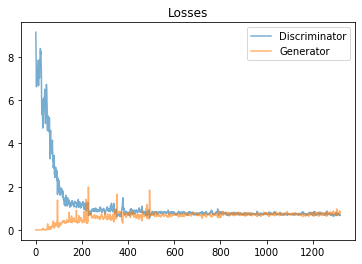

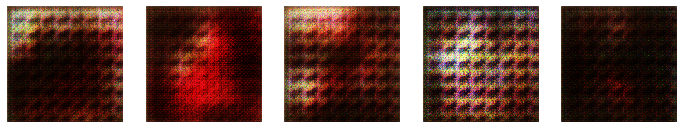

Epoch 21/300 
Duration: 56.31578 
D Loss: 0.73284 
G Loss: 0.71165


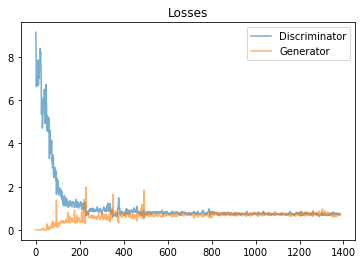

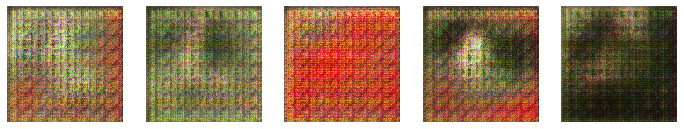

Epoch 22/300 
Duration: 56.38460 
D Loss: 0.72764 
G Loss: 0.74087


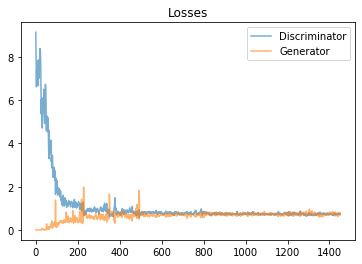

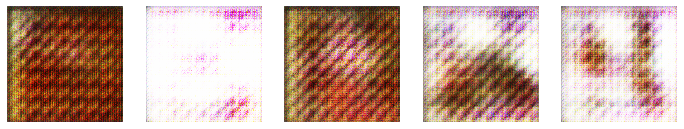

Epoch 23/300 
Duration: 56.50427 
D Loss: 0.72438 
G Loss: 0.74939


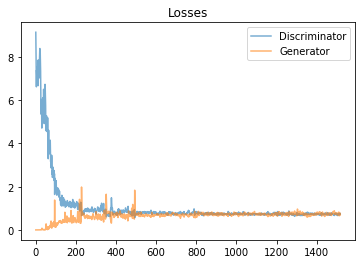

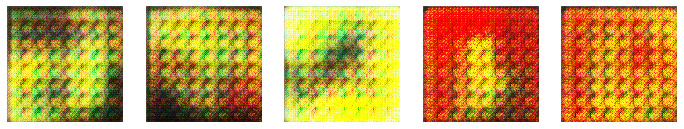

Epoch 24/300 
Duration: 56.43571 
D Loss: 0.73237 
G Loss: 0.71706


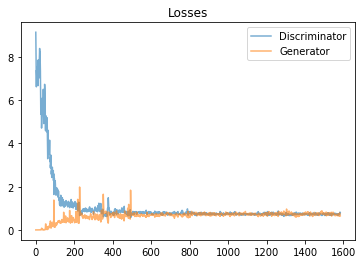

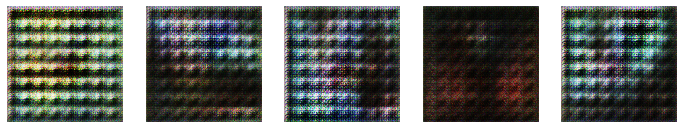

Epoch 25/300 
Duration: 56.44042 
D Loss: 0.74007 
G Loss: 0.71717


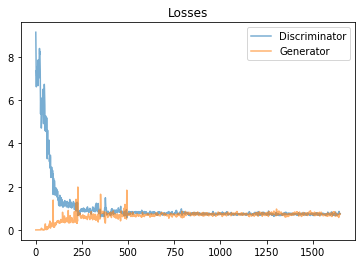

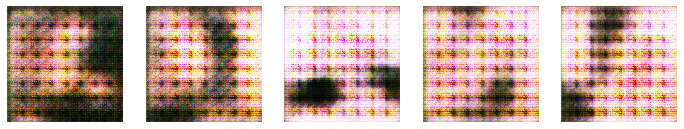

Epoch 26/300 
Duration: 56.40494 
D Loss: 0.72170 
G Loss: 0.74909


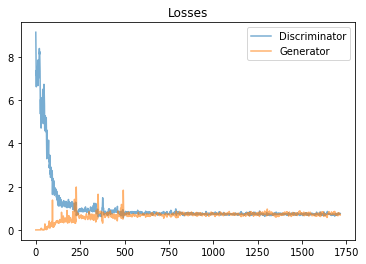

In [0]:
with tf.Graph().as_default():
    train(get_batches(input_images), input_images.shape)